In [1]:
import pandas as pd
import numpy as np
import nltk
import re

In [2]:
import matplotlib.pyplot as plt

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
df = pd.read_csv("employee_reviews.csv")

In [5]:
df.replace('none',np.NaN,inplace=True)

In [6]:
df.shape

(67529, 17)

In [7]:
df.head(2)

,Unnamed: 0,company,location,dates,job-title,summary,pros,cons,advice-to-mgmt,overall-ratings,work-balance-stars,culture-values-stars,carrer-opportunities-stars,comp-benefit-stars,senior-mangemnet-stars,helpful-count,link
0,1,google,NaN,"Dec 11, 2018",Current Employee - Anonymous Employee,Best Company to work for,People are smart and friendly,Bureaucracy is slowing things down,NaN,5.0,4.0,5.0,5.0,4.0,5.0,0,https://www.glassdoor.com/Reviews/Google-Revie...
1,2,google,"Mountain View, CA","Jun 21, 2013",Former Employee - Program Manager,"Moving at the speed of light, burn out is inev...","1) Food, food, food. 15+ cafes on main campus ...",1) Work/life balance. What balance? All those ...,1) Don't dismiss emotional intelligence and ad...,4.0,2.0,3.0,3.0,5.0,3.0,2094,https://www.glassdoor.com/Reviews/Google-Revie...


In [8]:
df.isna().sum()

Unnamed: 0                        0
company                           0
location                      25085
dates                             0
job-title                         0
summary                         129
pros                              0
cons                              1
advice-to-mgmt                29461
overall-ratings                   0
work-balance-stars             7160
culture-values-stars          13546
carrer-opportunities-stars     7108
comp-benefit-stars             7161
senior-mangemnet-stars         7775
helpful-count                     0
link                              0
dtype: int64

In [9]:
df.dtypes

Unnamed: 0                      int64
company                        object
location                       object
dates                          object
job-title                      object
summary                        object
pros                           object
cons                           object
advice-to-mgmt                 object
overall-ratings               float64
work-balance-stars             object
culture-values-stars           object
carrer-opportunities-stars     object
comp-benefit-stars             object
senior-mangemnet-stars         object
helpful-count                   int64
link                           object
dtype: object

In [10]:
df.columns

Index(['Unnamed: 0', 'company', 'location', 'dates', 'job-title', 'summary',
       'pros', 'cons', 'advice-to-mgmt', 'overall-ratings',
       'work-balance-stars', 'culture-values-stars',
       'carrer-opportunities-stars', 'comp-benefit-stars',
       'senior-mangemnet-stars', 'helpful-count', 'link'],
      dtype='object')

In [11]:
df['summary'].fillna('None',inplace=True)
df['advice-to-mgmt'].fillna('None',inplace=True)
df['cons'].fillna('None',inplace=True)

In [12]:
review_date=[]
for each_date in df['dates']:
    month=(each_date[:4])
    year=(each_date[-4:])
    date=month+' '+year
    review_date.append(date)


In [13]:
df['review_date']=review_date

In [16]:
df.head()

,company,location,job-title,summary,pros,cons,advice-to-mgmt,overall-ratings,helpful-count,review_date
0,google,NaN,Current Employee - Anonymous Employee,Best Company to work for,People are smart and friendly,Bureaucracy is slowing things down,None,5.0,0,Dec 2018
1,google,"Mountain View, CA",Former Employee - Program Manager,"Moving at the speed of light, burn out is inev...","1) Food, food, food. 15+ cafes on main campus ...",1) Work/life balance. What balance? All those ...,1) Don't dismiss emotional intelligence and ad...,4.0,2094,Jun 2013
2,google,"New York, NY",Current Employee - Software Engineer III,Great balance between big-company security and...,"* If you're a software engineer, you're among ...","* It *is* becoming larger, and with it comes g...",Keep the focus on the user. Everything else wi...,5.0,949,May 2014
3,google,"Mountain View, CA",Current Employee - Anonymous Employee,The best place I've worked and also the most d...,You can't find a more well-regarded company th...,I live in SF so the commute can take between 1...,Keep on NOT micromanaging - that is a huge ben...,5.0,498,Feb 2015
4,google,"Los Angeles, CA",Former Employee - Software Engineer,"Unique, one of a kind dream job",Google is a world of its own. At every other c...,"If you don't work in MTV (HQ), you will be giv...",Promote managers into management for their man...,5.0,49,Jul 2018


In [15]:
df.drop(['Unnamed: 0','dates','work-balance-stars', 'culture-values-stars',
       'carrer-opportunities-stars', 'comp-benefit-stars',
       'senior-mangemnet-stars','link'],axis=1,inplace=True)

In [11]:
df['review_date'].nunique()

135

# EDA

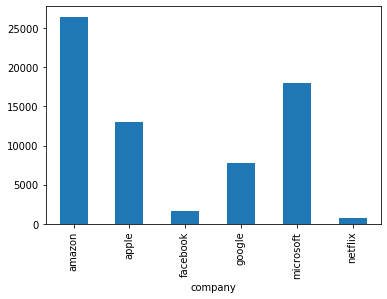

In [12]:
df.groupby('company')['overall-ratings'].count().plot(kind='bar')

In [14]:
print(df.groupby(['overall-ratings','company'])['company'].size().unstack(level=1,fill_value=0))
#df.groupby(['overall-ratings','company'])['company'].count().unstack().plot(kind='bar',figsize=(7,))

company          amazon  apple  facebook  google  microsoft  netflix
overall-ratings                                                     
1.0                2461    484        47     155        639      120
2.0                2751    814        49     248       1308      112
3.0                5574   2266        98     763       3819      133
4.0                8091   4581       245    2275       7101      205
5.0                7553   4805      1151    4378       5063      240


In [ ]:
current_employees_df=df[df['job-title'].str.startswith('C')]
former_employees_df=df[df['job-title'].str.startswith('F')]

# current employees rating to their companies

company          amazon  apple  facebook  google  microsoft  netflix
overall-ratings                                                     
1.0                1097    190        20      70        320       27
2.0                1436    385        26     114        686       40
3.0                3411   1208        54     396       2188       43
4.0                5689   2516       159    1273       4541      121
5.0                5976   2980      1020    2826       3554      174


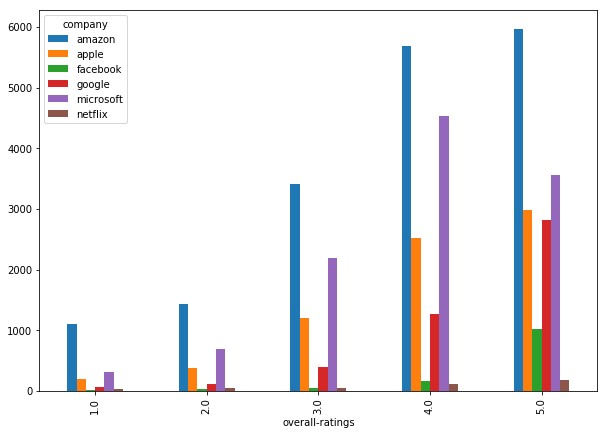

In [19]:
print(current_employees_df.groupby(['overall-ratings','company'])['company'].count().unstack(level=1,fill_value=0))
current_employees_df.groupby(['overall-ratings','company'])['company'].count().unstack().plot(kind='bar',figsize=(10,7))

In [13]:
df.head(5)

,company,location,job-title,summary,pros,cons,advice-to-mgmt,overall-ratings,helpful-count,review_date
0,google,NaN,Current Employee - Anonymous Employee,Best Company to work for,People are smart and friendly,Bureaucracy is slowing things down,None,5.0,0,Dec 2018
1,google,"Mountain View, CA",Former Employee - Program Manager,"Moving at the speed of light, burn out is inev...","1) Food, food, food. 15+ cafes on main campus ...",1) Work/life balance. What balance? All those ...,1) Don't dismiss emotional intelligence and ad...,4.0,2094,Jun 2013
2,google,"New York, NY",Current Employee - Software Engineer III,Great balance between big-company security and...,"* If you're a software engineer, you're among ...","* It *is* becoming larger, and with it comes g...",Keep the focus on the user. Everything else wi...,5.0,949,May 2014
3,google,"Mountain View, CA",Current Employee - Anonymous Employee,The best place I've worked and also the most d...,You can't find a more well-regarded company th...,I live in SF so the commute can take between 1...,Keep on NOT micromanaging - that is a huge ben...,5.0,498,Feb 2015
4,google,"Los Angeles, CA",Former Employee - Software Engineer,"Unique, one of a kind dream job",Google is a world of its own. At every other c...,"If you don't work in MTV (HQ), you will be giv...",Promote managers into management for their man...,5.0,49,Jul 2018


In [17]:
positive_reviews_df=df.loc[df['overall-ratings']>3.0]
neutral_reviews_df=df.loc[df['overall-ratings']==3.0]
negative_reviews_df=df.loc[df['overall-ratings']<3.0]

In [18]:
cols=['summary','pros','cons']
positive_df=positive_reviews_df[cols]
neutral_df=neutral_reviews_df[cols]
negative_df=negative_reviews_df[cols]

In [20]:
negative_df.head()

,summary,pros,cons
55,Depends on what you're looking for,For the right people it can be a great place. ...,Projects can be boring or useless. Work may no...
92,China Search Project is Concerning,"Intellectually stimulating place with many ""be...",I think the culture has lost its way. It's a s...
102,pockets of incompetence,"Overall, Google pays well and showers people w...","There are deep, deep pockets of dysfunction an..."
124,WTF are they even doing?,Pay was excellent. Perks were great. Office wa...,-I started just before a big reorg. I had 9 di...
144,Fun perks - wouldn’t contract there again,"Perks were great, as well as being around inte...",Being a contractor I didn’t recrive a lot of r...


In [21]:
positive_df['all_reviews']=positive_df['summary']+" "+positive_df['pros']+" "+positive_df['cons']
positive_df=positive_df['all_reviews']

neutral_df['all_reviews']=neutral_df['summary']+" "+neutral_df['pros']+" "+neutral_df['cons']
neutral_df=neutral_df['all_reviews']

negative_df['all_reviews']=negative_df['summary']+" "+negative_df['pros']+" "+negative_df['cons']
negative_df=negative_df['all_reviews']

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexe

In [23]:
negative_df

55       Depends on what you're looking for For the rig...
92       China Search Project is Concerning Intellectua...
102      pockets of incompetence Overall, Google pays w...
124      WTF are they even doing? Pay was excellent. Pe...
144      Fun perks - wouldn’t contract there again Perk...
                               ...                        
67496    Not a place to work for people who actually ar...
67503    was once a great place to work still some pock...
67506    It was always difficult, whether it was a mult...
67521    Microsoft Services is bad. MS is a good compan...
67528    Used to be great Compensation, Health benefits...
Name: all_reviews, Length: 9188, dtype: object

In [27]:
import nltk
# nltk.download('all')

from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer


[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\abc.zip.
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\alpino.zip.
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\biocreative_ppi.zip.
[nltk_data]    | Downloading package brown to
[nltk_data]    |     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\brown.zip.
[nltk_data]    | Downloading package brown_tei to
[nltk_data]    |     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\brown_tei.zip.
[nltk_data]    | Downloading package cess_cat to
[nltk_data]    |     C:\Users\lenovo\AppData\Roaming\nltk_data...


KeyboardInterrupt: 

In [23]:
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.tokenize import TweetTokenizer
#from wordcloud import WordCloud

In [20]:
import re
stopwords=nltk.corpus.stopwords.words('english')
lemmatizer=WordNetLemmatizer()

In [24]:
print(stopwords)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [25]:
positive_texts=positive_df.str.cat(sep='.')
neutral_texts=neutral_df.str.cat(sep='.')
negative_texts=negative_df.str.cat(sep='.')

In [26]:
positive_texts

'Best Company to work for People are smart and friendly Bureaucracy is slowing things down.Moving at the speed of light, burn out is inevitable 1) Food, food, food. 15+ cafes on main campus (MTV) alone. Mini-kitchens, snacks, drinks, free breakfast/lunch/dinner, all day, errr\'day.  2) Benefits/perks. Free 24:7 gym access (on MTV campus). Free (self service) laundry (washer/dryer) available. Bowling alley. Volley ball pit. Custom-built and exclusive employee use only outdoor sport park (MTV). Free health/fitness assessments. Dog-friendly. Etc. etc. etc.  3) Compensation. In ~2010 or 2011, Google updated its compensation packages so that they were more competitive.  4) For the size of the organization (30K+), it has remained relatively innovative, nimble, and fast-paced and open with communication but, that is definitely changing (for the worse).  5) With so many departments, focus areas, and products, *in theory*, you should have plenty of opportunity to grow your career (horizontally 

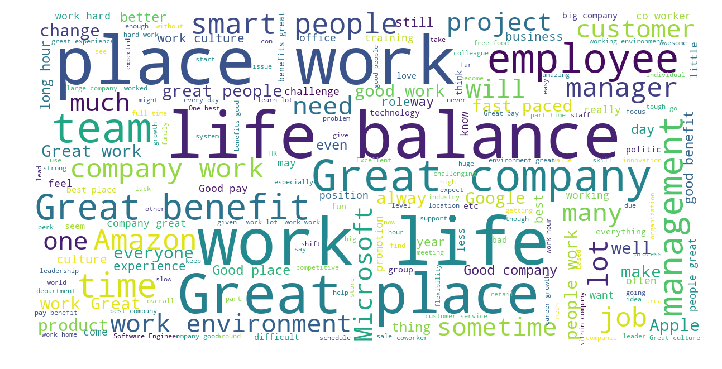

In [28]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=200,
        max_font_size=40, 
        scale=3,
        random_state=1
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

show_wordcloud(positive_texts)

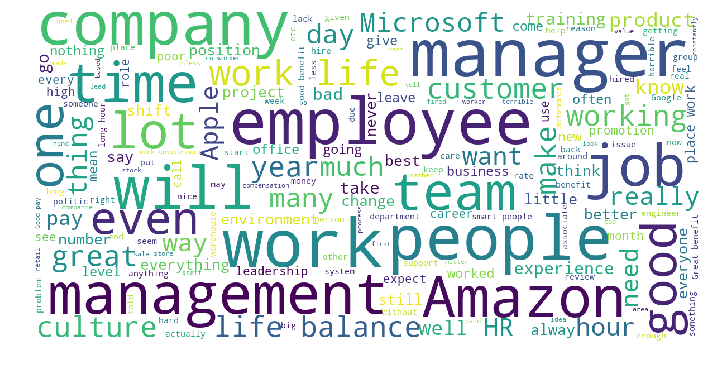

In [29]:
show_wordcloud(negative_texts)

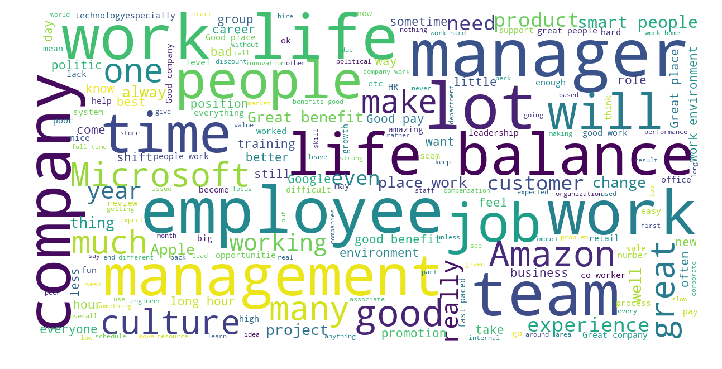

In [30]:
show_wordcloud(neutral_texts)

In [27]:
tokenizer = TweetTokenizer(preserve_case=False, strip_handles=True, reduce_len=True)
tweet_tokens = tokenizer.tokenize(positive_texts)

In [26]:
def clean_text(text):
    text=re.sub(r"''","",text)
    text=text.replace("Etc.","")
    text=text.replace("etc.","")
    text=re.sub(r"[0-9]",'',text)
    text=re.sub(r'[!?:/)(*+~\"-,]','',text)
    
    # tokenize tweets
    tokenizer = TweetTokenizer(preserve_case=False, strip_handles=True, reduce_len=True)
    tweet_tokens = tokenizer.tokenize(text)
    
    reviews_clean = []    
    for word in tweet_tokens:
        if word not in stopwords:
            lem_word = lemmatizer.lemmatize(word)
            reviews_clean.append(lem_word)
 
    return reviews_clean

In [29]:
def bagOfWords(review):
    words=clean_text(review)
    word_dictionary=dict([word,True] for word in words)
    return word_dictionary

In [30]:
bagOfWords('Night shifts, Work gets a little')

{'night': True, 'shift': True, 'work': True, 'get': True, 'little': True}

In [31]:
positive_review_set=[]
for each_review in positive_texts.split('.'):
   positive_review_set.append((bagOfWords(each_review), 'Positive Review'))

In [33]:
positive_review_set[:2]

[({'best': True,
   'company': True,
   'work': True,
   'people': True,
   'smart': True,
   'friendly': True,
   'bureaucracy': True,
   'slowing': True,
   'thing': True},
  'Positive Review'),
 ({'moving': True,
   'speed': True,
   'light': True,
   'burn': True,
   'inevitable': True,
   'food': True},
  'Positive Review')]

In [35]:
neutral_review_set=[]
for each_review in neutral_texts.split('.'):
   neutral_review_set.append((bagOfWords(each_review), 'Neutral Review'))

In [36]:
negative_review_set=[]
for each_review in negative_texts.split('.'):
   negative_review_set.append((bagOfWords(each_review), 'Negative Review'))

In [37]:
from random import shuffle 
shuffle(positive_review_set)
shuffle(neutral_review_set)
shuffle(negative_review_set)
 
train_set = positive_review_set[:150000] + neutral_review_set[:150000] + negative_review_set[:150000]
test_set = positive_review_set[150000:] + neutral_review_set[150000:] + negative_review_set[150000:]
 
print(len(test_set),  len(train_set))

28410 274966


In [38]:
from nltk import classify
from nltk import NaiveBayesClassifier

classifier = NaiveBayesClassifier.train(train_set)
 
accuracy = classify.accuracy(classifier, test_set)
print(accuracy*100)

80.11967617036255


In [39]:
custom_review="a less work load and easy to get everything completed"

cr=bagOfWords(custom_review)
print(classifier.classify(cr))

{'le': True, 'work': True, 'load': True, 'easy': True, 'get': True, 'everything': True, 'completed': True}
Positive Review
